Processing 00000.jpg ...


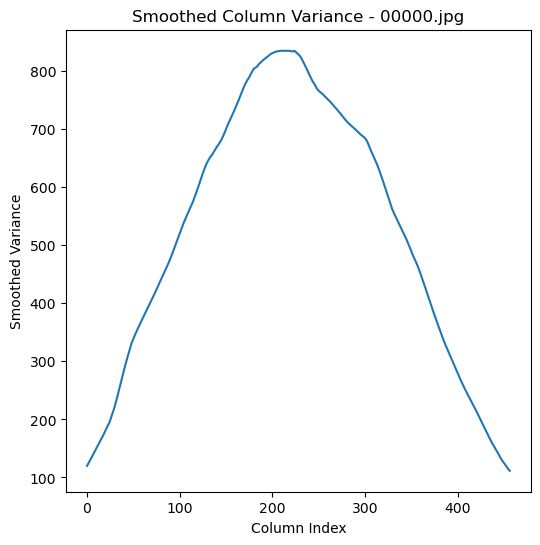

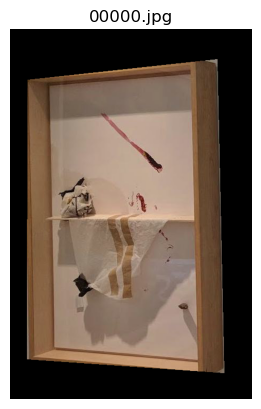

Processing 00001.jpg ...


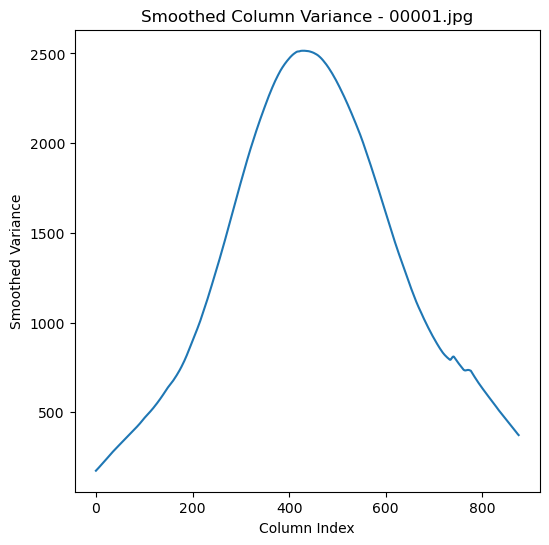

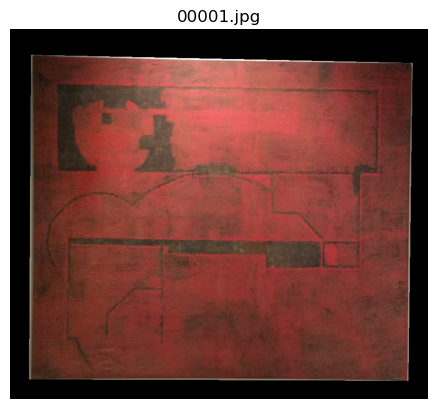

Processing 00002.jpg ...


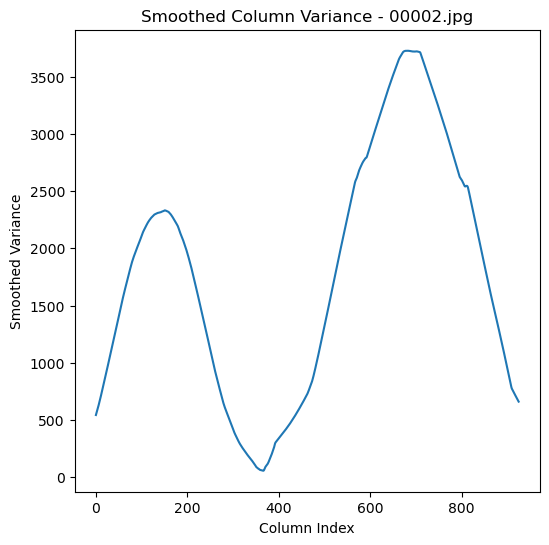

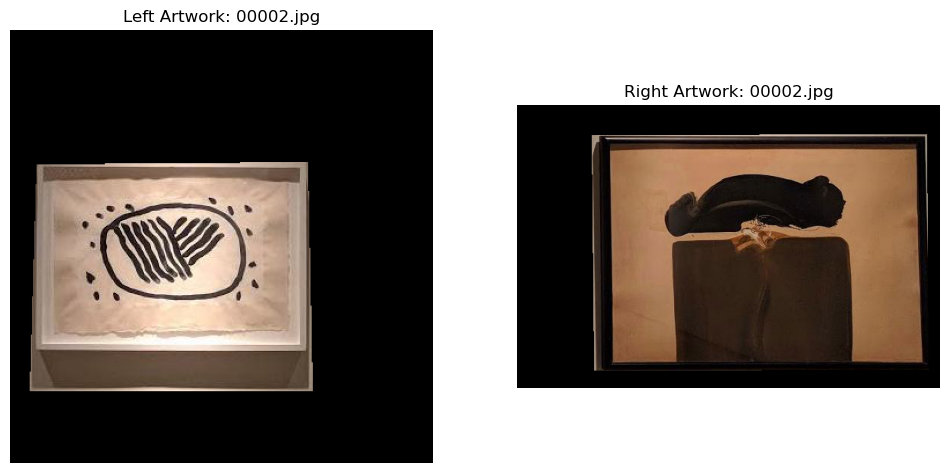

Processing 00003.jpg ...


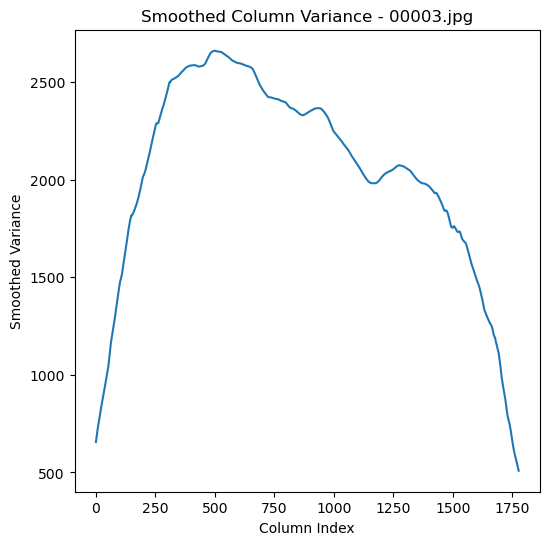

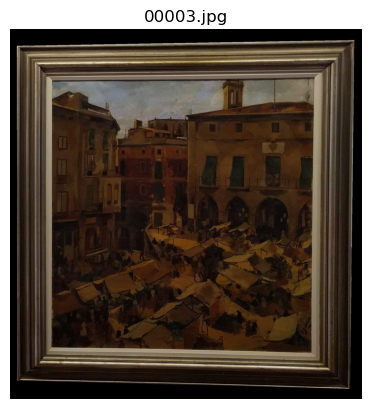

Processing 00004.jpg ...


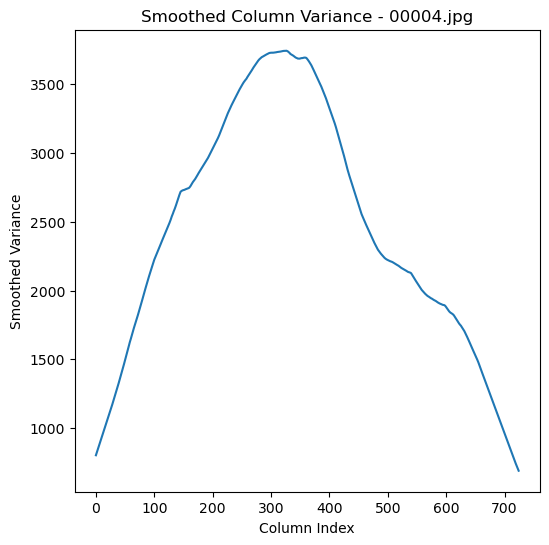

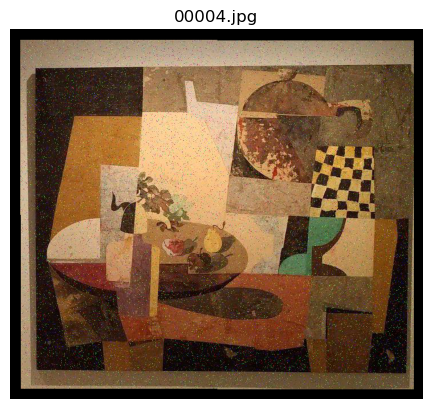

Processing 00005.jpg ...


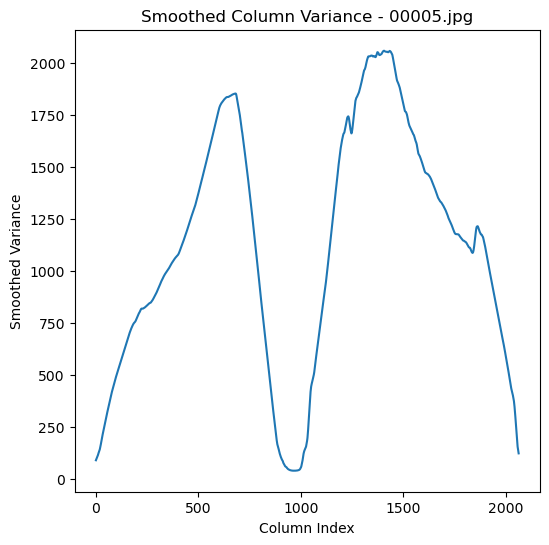

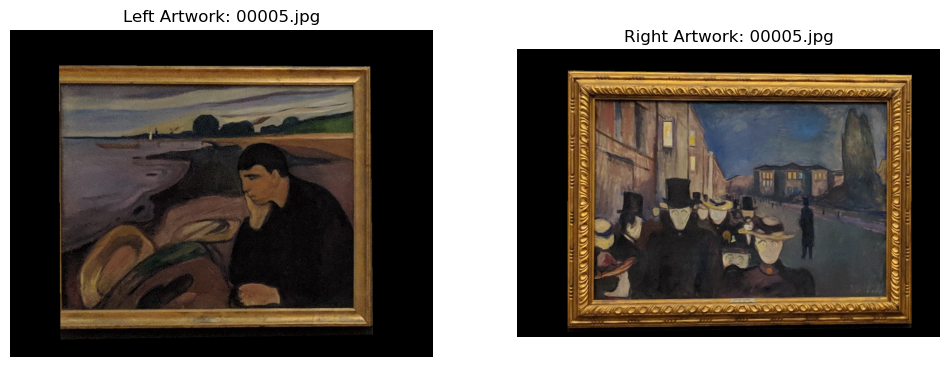

Processing 00006.jpg ...


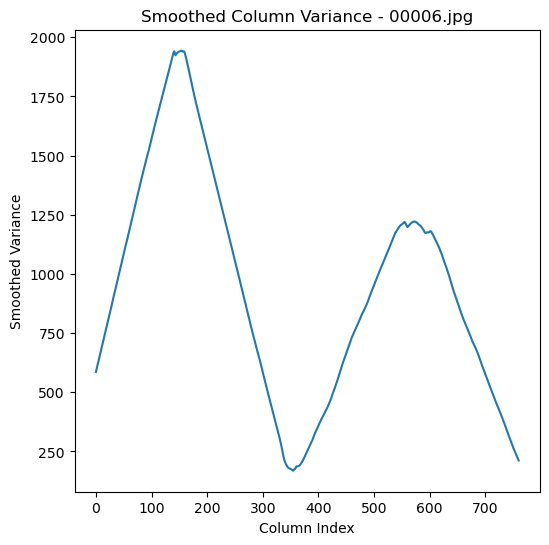

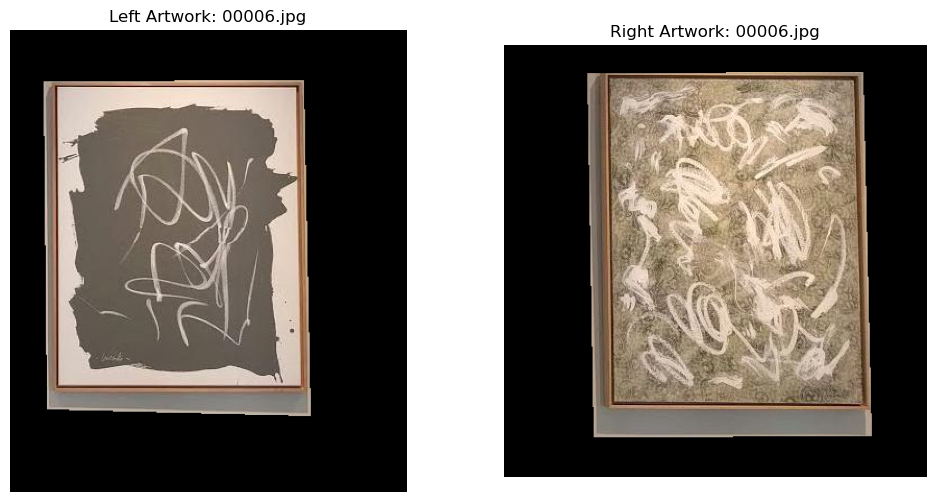

Processing 00007.jpg ...


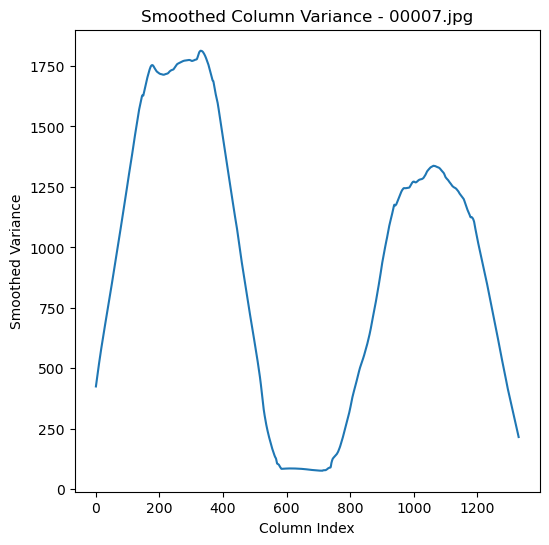

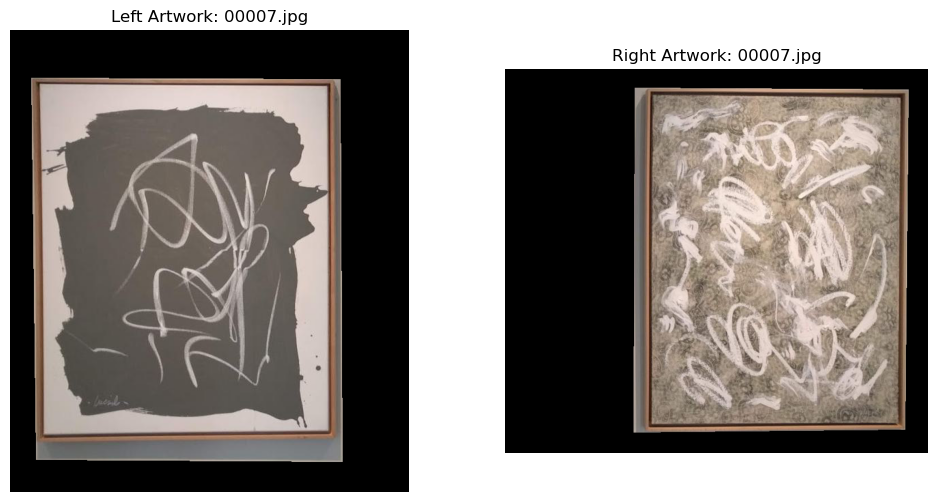

Processing 00008.jpg ...


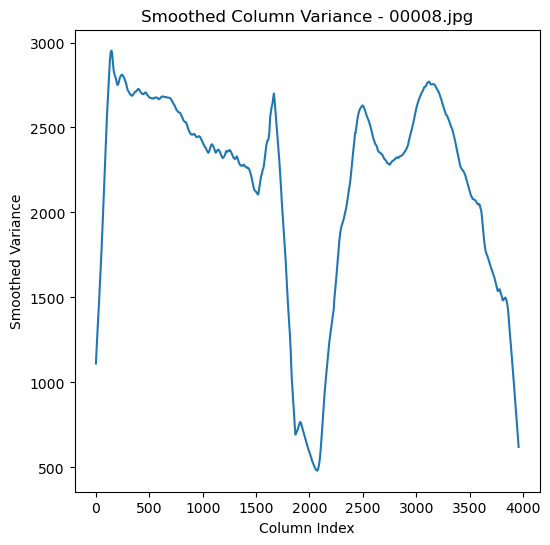

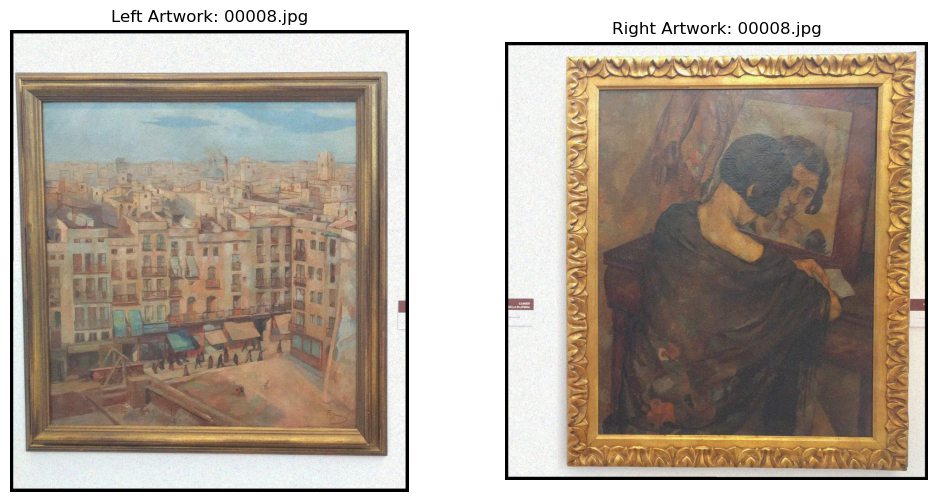

Processing 00009.jpg ...


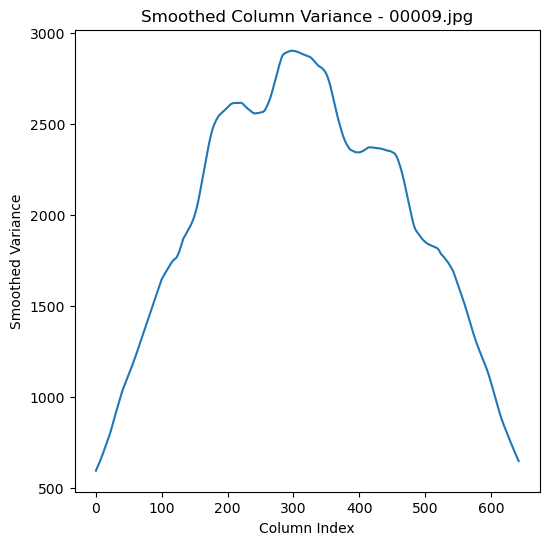

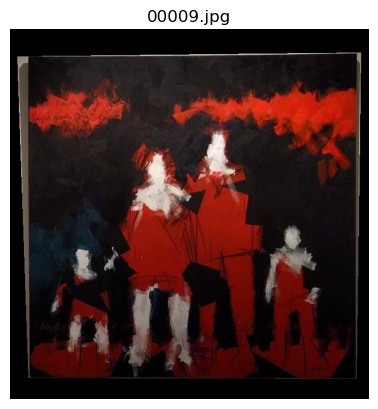

Processing 00010.jpg ...


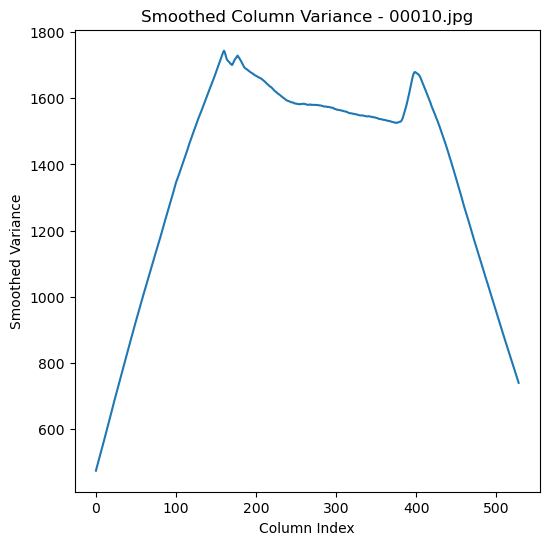

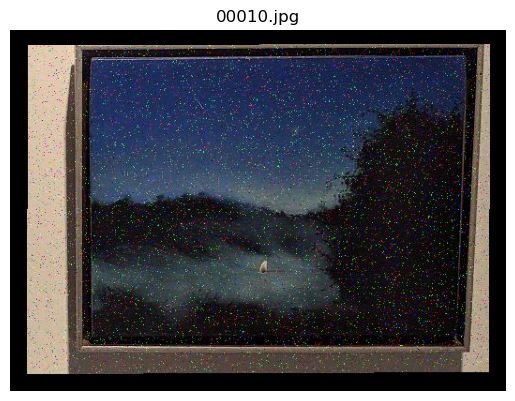

Processing 00011.jpg ...


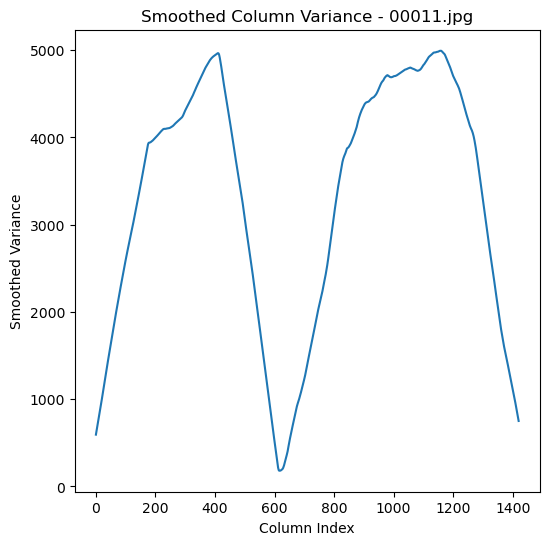

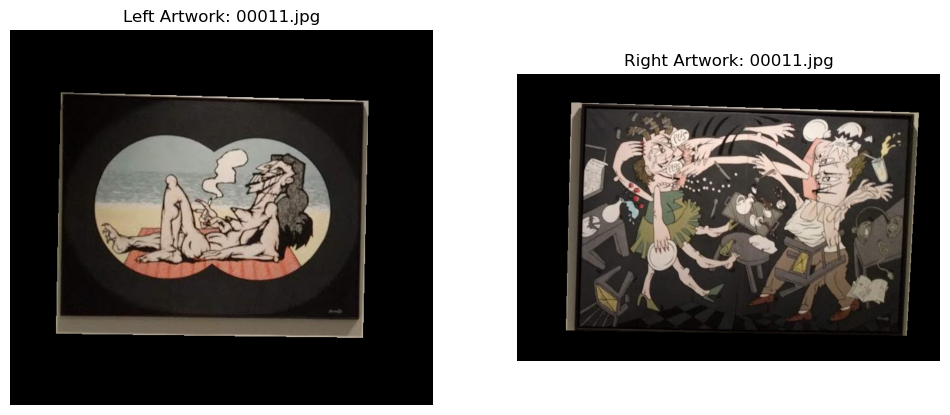

Processing 00012.jpg ...


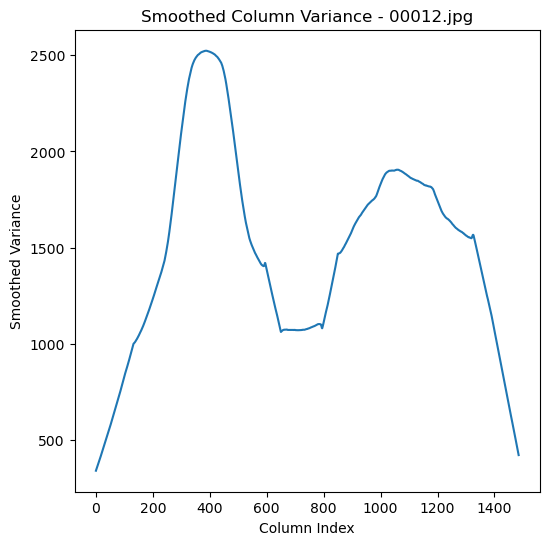

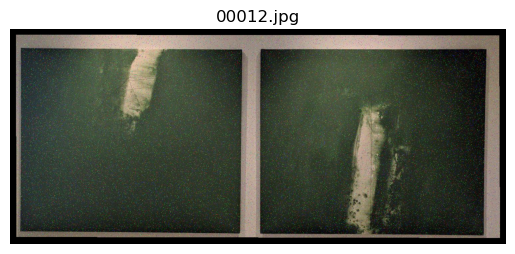

Processing 00013.jpg ...


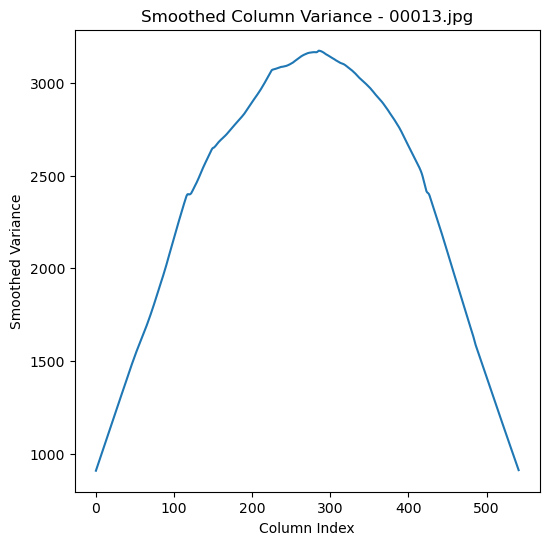

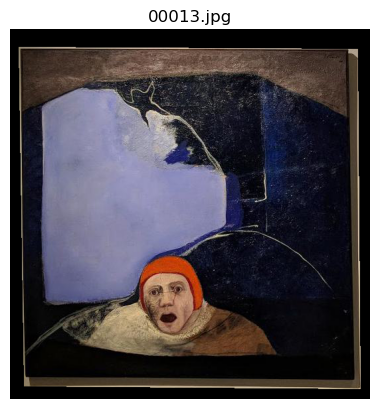

Processing 00014.jpg ...


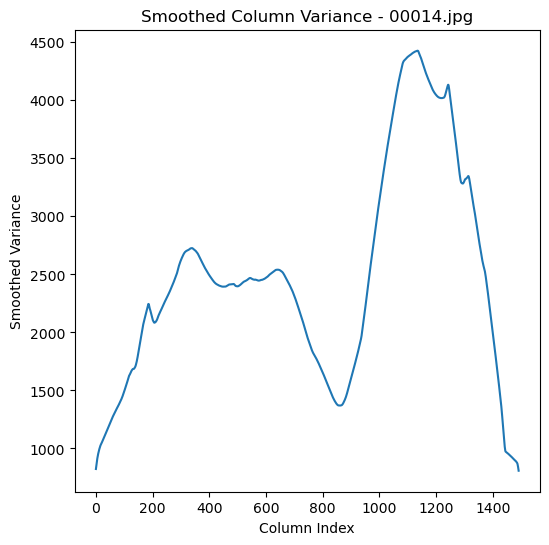

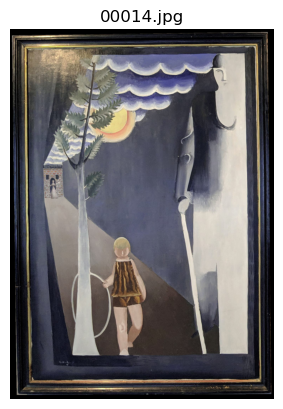

Processing 00015.jpg ...


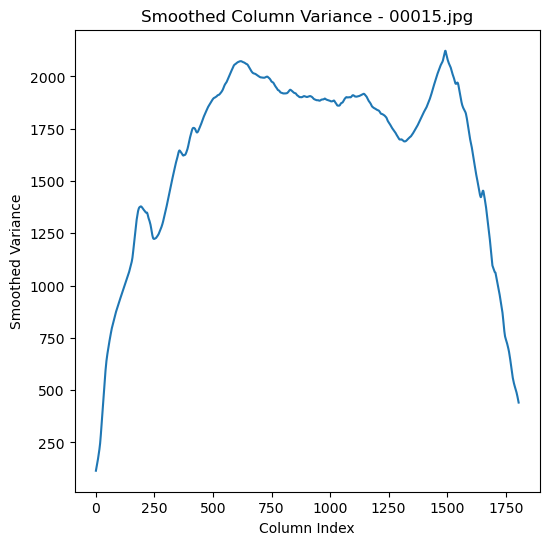

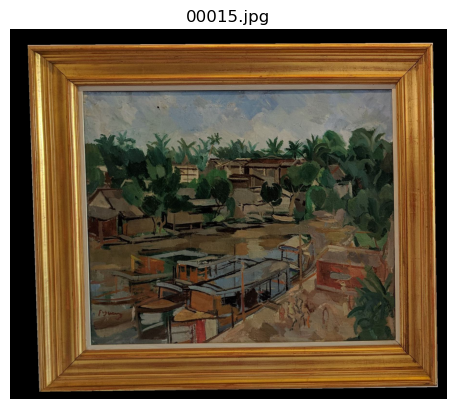

Processing 00016.jpg ...


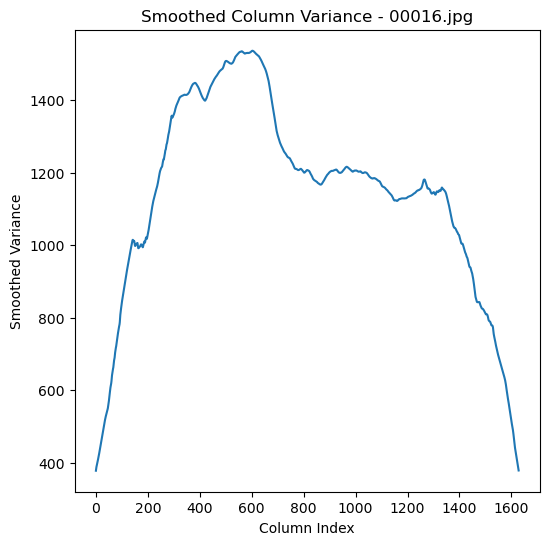

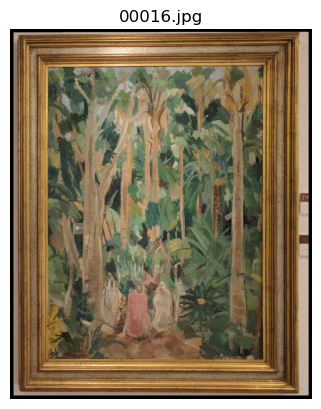

Processing 00017.jpg ...


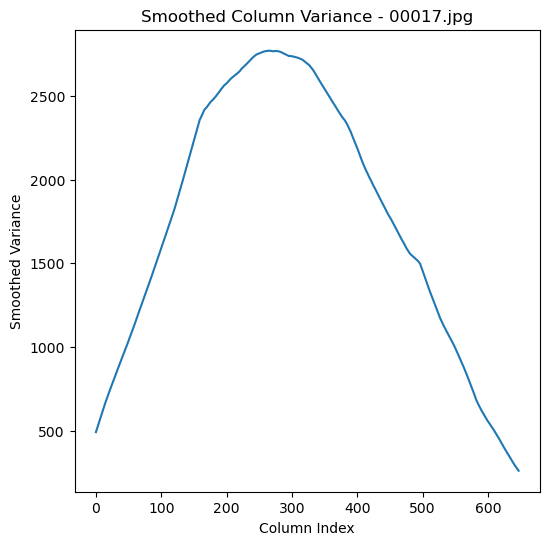

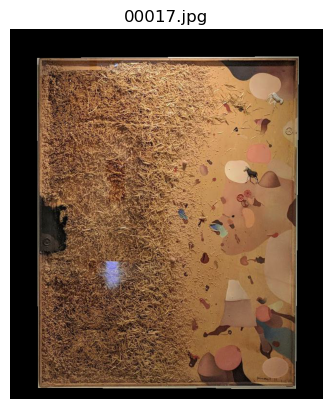

Processing 00018.jpg ...


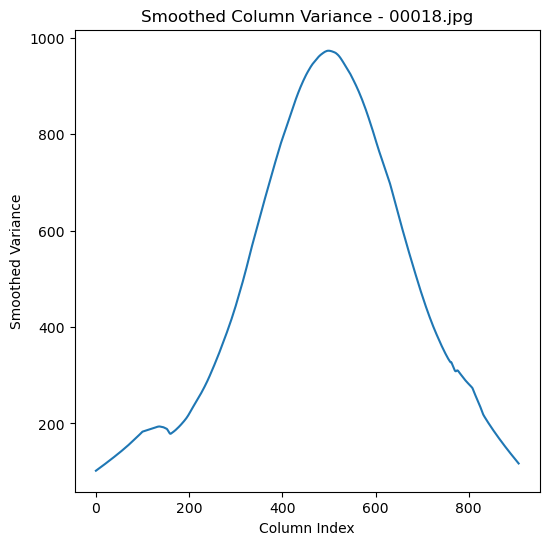

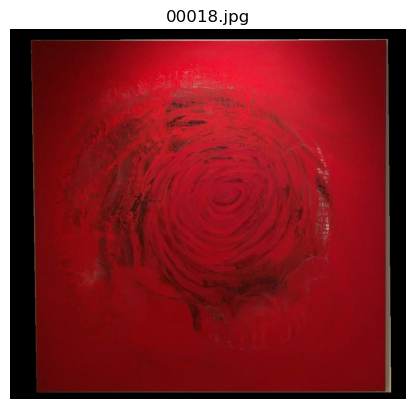

Processing 00019.jpg ...


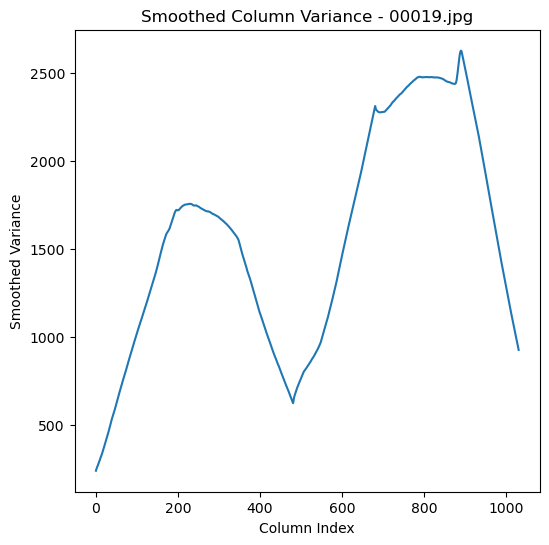

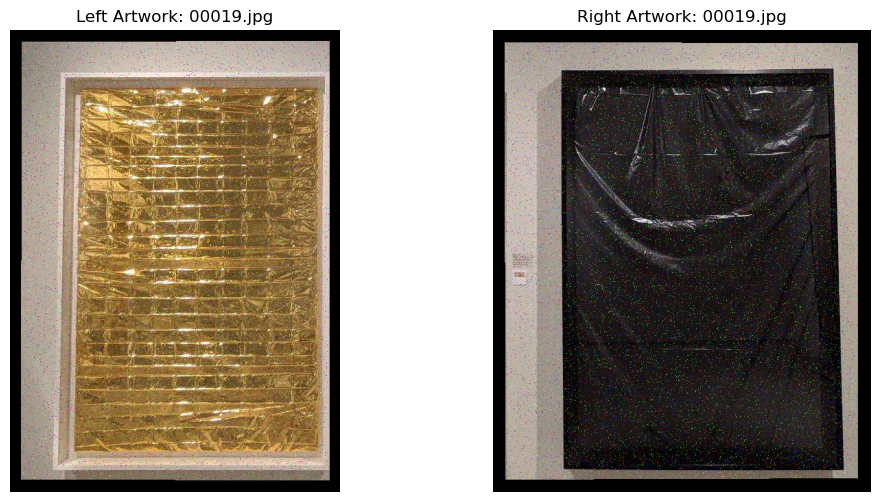

Processing 00020.jpg ...


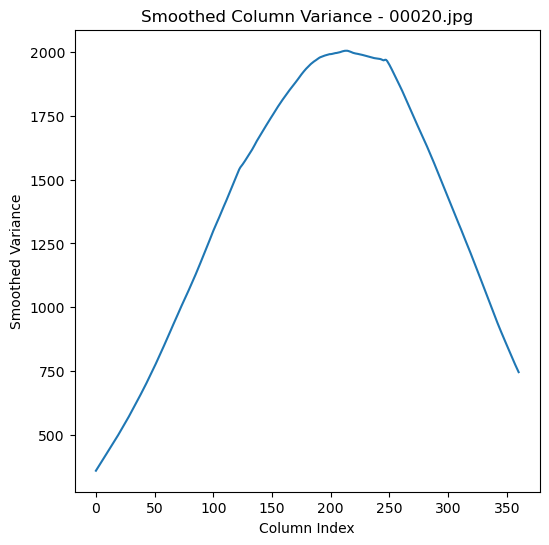

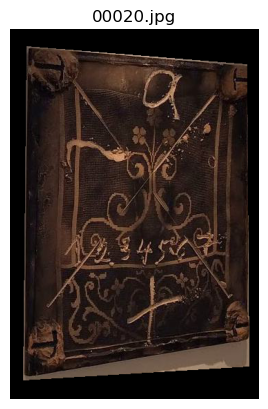

Processing 00021.jpg ...


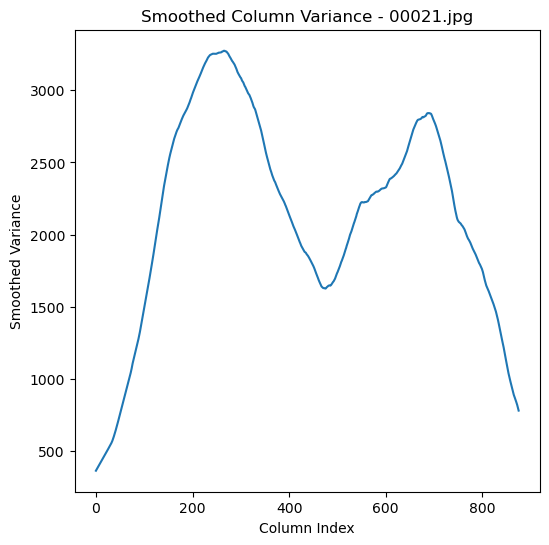

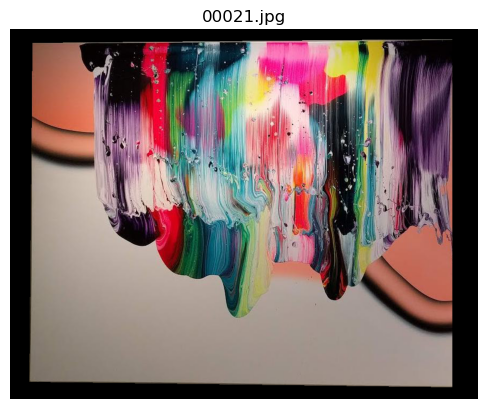

Processing 00022.jpg ...


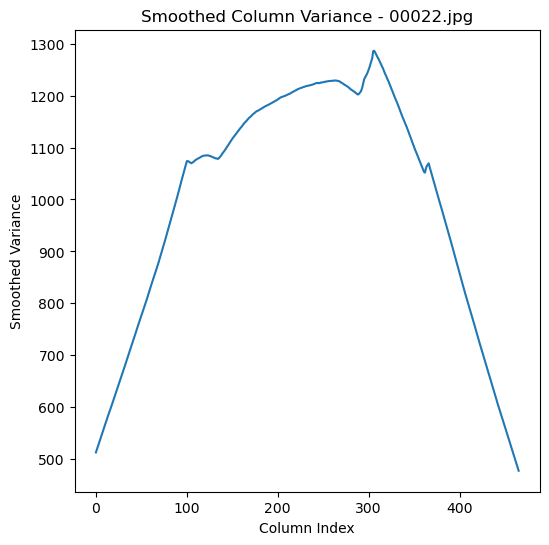

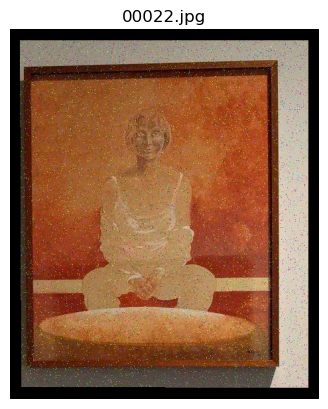

Processing 00023.jpg ...


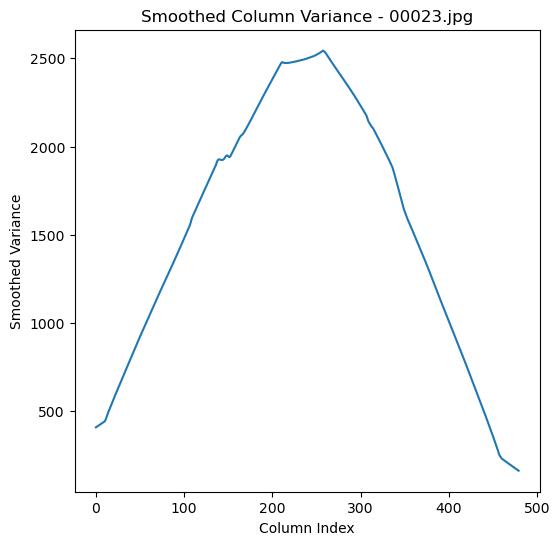

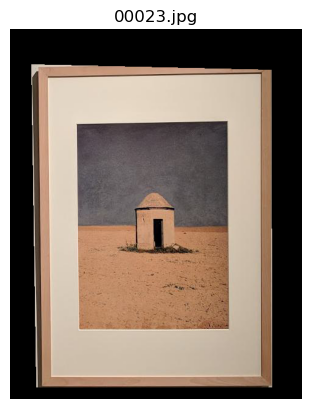

Processing 00024.jpg ...


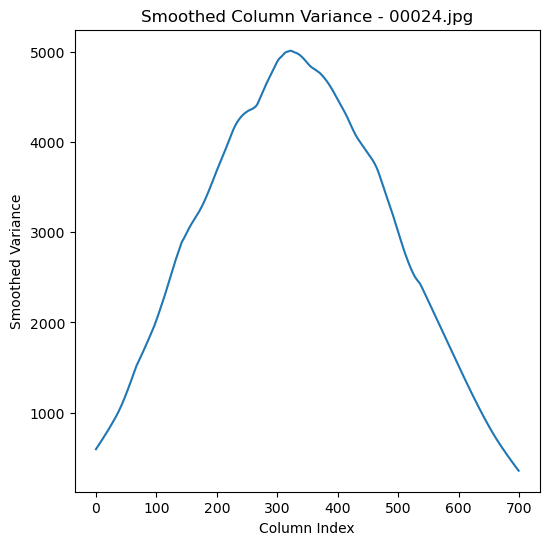

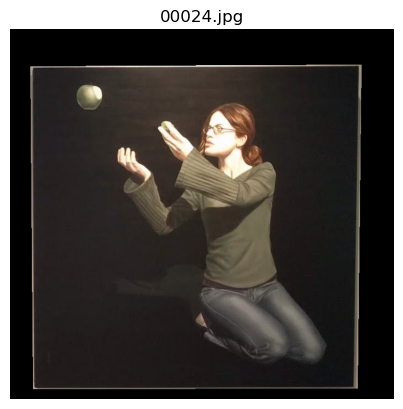

Processing 00025.jpg ...


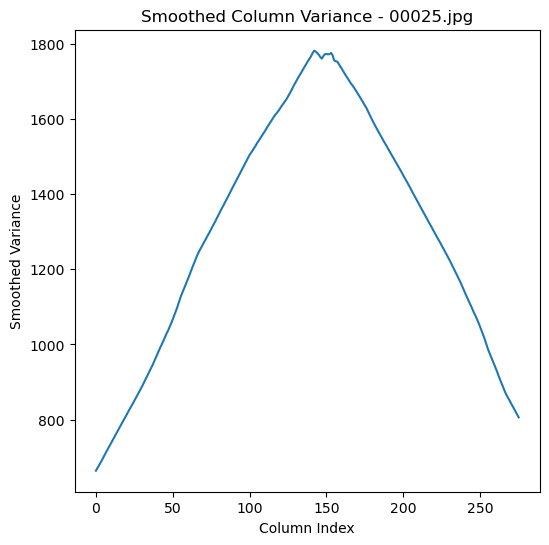

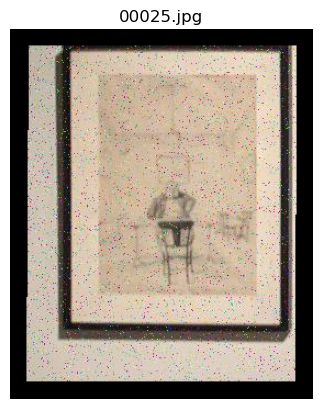

Processing 00026.jpg ...


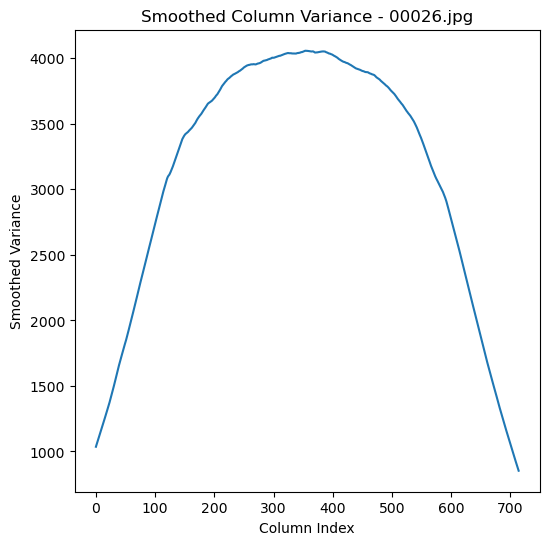

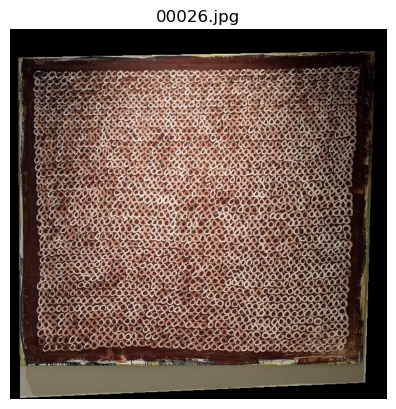

Processing 00027.jpg ...


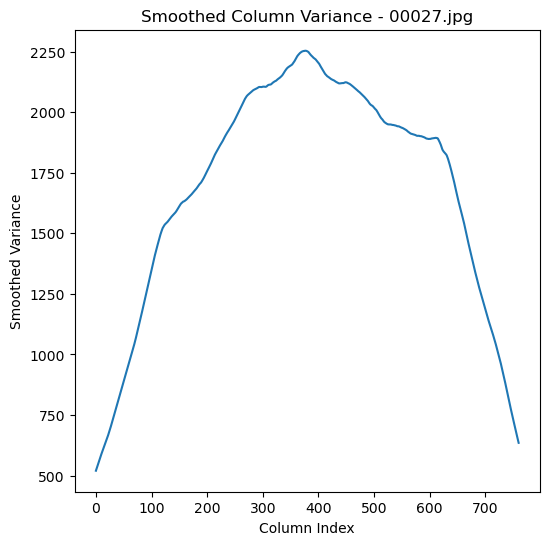

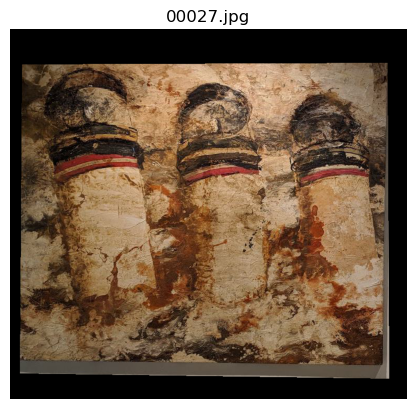

Processing 00028.jpg ...


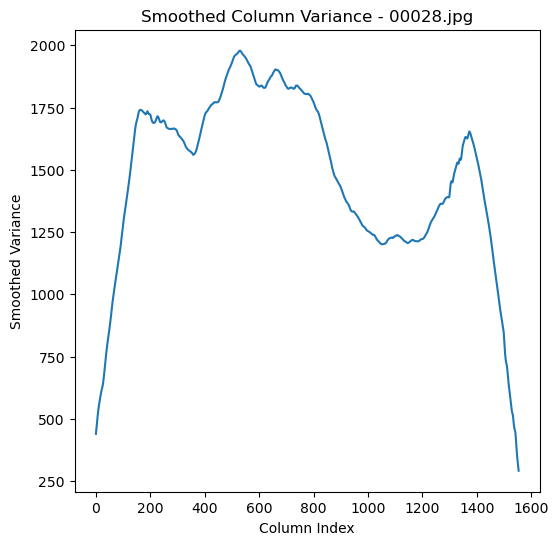

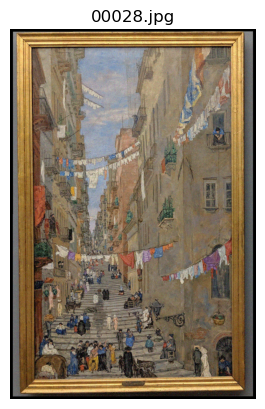

Processing 00029.jpg ...


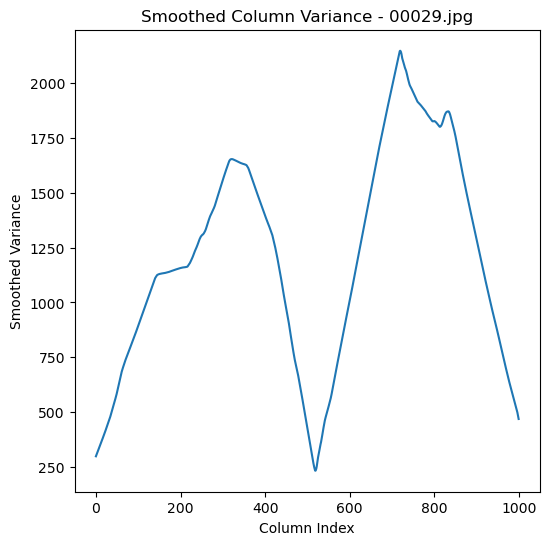

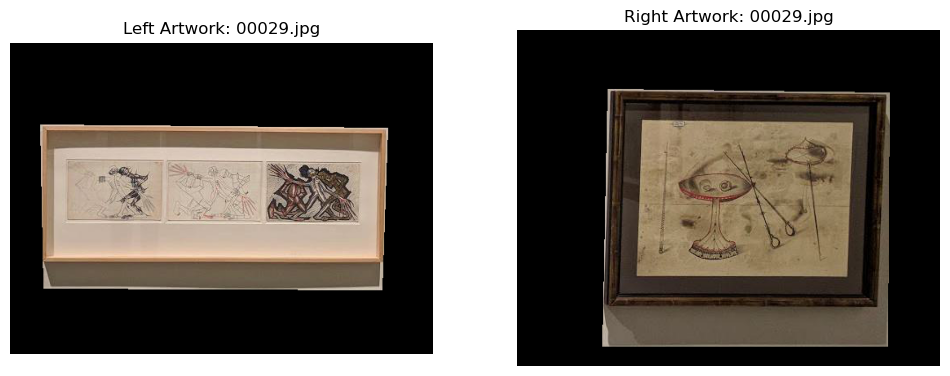

In [75]:
import cv2
import numpy as np
import os
import matplotlib.pyplot as plt
from background_removal_exp import background_remover_w2

# Path to your new dataset
IMG_FOLDER = "../Data/Week3/qsd2_w3/"

def calculate_variance(image):
    """Calculate the variance for each row and column."""
    row_variances = np.var(image, axis=1)
    col_variances = np.var(image, axis=0)
    return row_variances, col_variances

def smooth_variance(variances, window_size=5):
    """Smooth the variance using a moving average."""
    return np.convolve(variances, np.ones(window_size)/window_size, mode='same')

def find_valleys_in_column_variance(col_variances, threshold=10):
    """Find valleys between two peaks in the column variance with a stricter threshold to avoid outliers."""
    valleys = []
    
    # Looking for a valley: a region where the variance drops significantly between two high variance regions
    for i in range(200, len(col_variances) - 200):
        # Ensure that the current variance is lower than its neighbors (a valley)
        if col_variances[i-1] > col_variances[i] and col_variances[i+1] > col_variances[i] and col_variances[i] < threshold:
            valleys.append(i)  # Valley position
    return valleys

def split_image_at_valley(image, valleys):
    """Split the image at the detected valley to separate two artworks."""
    if len(valleys) >= 1:
        # Take the first valley position to split the image
        valley_position = valleys[0]
        
        # Split the image into two parts
        left_artwork = image[:, :valley_position]
        right_artwork = image[:, valley_position:]
        
        return left_artwork, right_artwork
    return image  # Return original image if no valley found

def fit_polynomial(variances, degree=5):
    """Fit a polynomial to the smoothed variance."""
    # Fit a polynomial of given degree to the variance data
    x = np.arange(len(variances))
    coeffs = np.polyfit(x, variances, degree)
    poly = np.poly1d(coeffs)
    return poly(x)

def process_images(img_folder):
    """Process all images in the folder."""
    image_names = sorted([f for f in os.listdir(img_folder) if f.endswith('.jpg')])

    for img_name in image_names:
        print(f"Processing {img_name} ...")
        img_path = os.path.join(img_folder, img_name)
        
        # Load the image
        img = cv2.imread(img_path)
        if img is None:
            print(f"⚠️ Skipping {img_name}: could not read image.")
            continue
        
        # Convert to grayscale
        gray_img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
        
        # Calculate variances for rows and columns
        _, col_variances = calculate_variance(gray_img)
        
        # Smooth the column variance to simplify the graph
        smoothed_col_variances = smooth_variance(col_variances, window_size=200)
        
        # Plot smoothed variance for columns to visualize
        plt.figure(figsize=(6, 6))
        plt.plot(smoothed_col_variances)
        plt.title(f'Smoothed Column Variance - {img_name}')
        plt.xlabel('Column Index')
        plt.ylabel('Smoothed Variance')
        plt.show()

        # Find valleys in column variances to detect boundaries for cropping
        valleys = find_valleys_in_column_variance(smoothed_col_variances, threshold=750)
        
        # If valleys are found, split the image at the valley
        if valleys:
            left_artwork, right_artwork = split_image_at_valley(img, valleys)
            
            # Generate masks for both left and right artwork
            _,left_mask,left_output,_ = background_remover_w2.remove_background_morphological_gradient(left_artwork)
            _,right_mask,right_output,_ = background_remover_w2.remove_background_morphological_gradient(right_artwork)
        
            # Show the cropped images
            plt.figure(figsize=(12, 6))

            plt.subplot(1, 2, 1)
            plt.imshow(cv2.cvtColor(left_output, cv2.COLOR_BGR2RGB))
            plt.title(f"Left Artwork: {img_name}")
            plt.axis('off')

            plt.subplot(1, 2, 2)
            plt.imshow(cv2.cvtColor(right_output, cv2.COLOR_BGR2RGB))
            plt.title(f"Right Artwork: {img_name}")
            plt.axis('off')
            
        else:
            _,mask,output,_ = background_remover_w2.remove_background_morphological_gradient(img)
            
            # Show the result image (with mask applied)
            plt.imshow(cv2.cvtColor(output, cv2.COLOR_BGR2RGB))
            plt.title(f"{img_name}")
            plt.axis('off')
            plt.show()

        plt.show()

# Run the function to process the images
process_images(IMG_FOLDER)
